<a href="https://colab.research.google.com/github/Sedowlas/Cat-Boost/blob/main/Nashik_regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Заливка данных

https://drive.google.com/file/d/1ly5ROlr9pJLgQP6FLG3TckfQIDNV_qtv/view?usp=sharing

In [ ]:
! gdown --id 1ly5ROlr9pJLgQP6FLG3TckfQIDNV_qtv

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1ly5ROlr9pJLgQP6FLG3TckfQIDNV_qtv
To: /content/final_data.csv
100% 940k/940k [00:00<00:00, 109MB/s]


#Предобработка

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
df = pd.read_csv('/content/final_data.csv')

In [ ]:
df.head()

,Unnamed: 0,address,owners,housetype,house_condition,BHK,price,per_month_emi,total_sqft,cordinates,latitude,longitude
0,0,"Sheetal Vihar, Bhagwant Nagar, Dr.Homi Bhabha ...",Mahendra Kotwal,Apartment,old,3.0,75.00,39.72,1550.0,Sheetal Vihar,19.987960,73.787390
1,1,"Samraat Dream Citi, Samta Nagar, Nashik",Jiten Dadarkar,Apartment,old,2.0,41.00,21.71,1000.0,Samraat Dream Citi,19.982460,73.811840
2,2,"Suryaprakash Apartment,Nashik Road, Nashik",Pankaj,Apartment,old,2.0,53.35,28.25,970.0,Surya Prakash,19.975850,73.788750
3,3,"Adishvar Residency,Nashik Road, Nashik",Saurav,Apartment,old,2.0,55.00,29.13,1000.0,"Nashik Road, Vadner Dumala, Nashik, Maharashtr...",19.930532,73.811734
4,4,"Nashik Road, Nashik",Vivek Pavanaskar,Apartment,old,2.0,27.00,14.30,853.0,"Nashik Road, Nashik, Maharashtra",19.955310,73.840890


In [ ]:
len(df)

5496

In [ ]:
df.columns = df.columns.str.lower().str.replace(' ','_')

In [ ]:
df.drop('unnamed:_0',axis=1,inplace=True)

In [ ]:
df.isna().mean()

address            0.000000
owners             0.002365
housetype          0.000000
house_condition    0.000000
bhk                0.029658
price              0.173581
per_month_emi      0.174672
total_sqft         0.274927
cordinates         0.000000
latitude           0.000000
longitude          0.000000
dtype: float64

#Анализ

In [ ]:
df.head()

,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude
0,"Sheetal Vihar, Bhagwant Nagar, Dr.Homi Bhabha ...",Mahendra Kotwal,Apartment,old,3.0,75.00,39.72,1550.0,Sheetal Vihar,19.987960,73.787390
1,"Samraat Dream Citi, Samta Nagar, Nashik",Jiten Dadarkar,Apartment,old,2.0,41.00,21.71,1000.0,Samraat Dream Citi,19.982460,73.811840
2,"Suryaprakash Apartment,Nashik Road, Nashik",Pankaj,Apartment,old,2.0,53.35,28.25,970.0,Surya Prakash,19.975850,73.788750
3,"Adishvar Residency,Nashik Road, Nashik",Saurav,Apartment,old,2.0,55.00,29.13,1000.0,"Nashik Road, Vadner Dumala, Nashik, Maharashtr...",19.930532,73.811734
4,"Nashik Road, Nashik",Vivek Pavanaskar,Apartment,old,2.0,27.00,14.30,853.0,"Nashik Road, Nashik, Maharashtra",19.955310,73.840890


In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
df.groupby(['cordinates','housetype','house_condition','bhk','total_sqft'])['price'].agg(['count','mean'])

count  \
cordinates                                         housetype         house_condition bhk  total_sqft          
2nd Street & 3rd Avenue, Anandvalli, Nashik, Ma... Apartment         new             1.0  555.0           1   
                                                                                          560.0           2   
                                                                                          585.0           1   
                                                                                     2.0  640.0           4   
                                                                                          660.0           1   
                                                                     old             1.0  600.0           1   
Aashirwad                                          Apartment         old             1.0  800.0           1   
                                                                                     2.0  750.0           1   
Aashirwad Blossom                                  Apartment         new             1.0  610.0           1   
Abhiyanta Nagar Road, Cidco, Nashik, Maharashtr... Apartment         new             1.0  650.0           1   
                                                                     old             1.0  590.0           1   
                                                                                     2.0  827.0           1   
                                                                                          912.0           1   
                                                                                          1000.0          1   
                                                   Independent house old             2.0  865.0           1   
                                                                                     3.0  2600.0          1   
Adarsh Credit Co-Operative Society-Nashik Road     Apartment         old             1.0  550.0           2   
                                                                                     2.0  1100.0          1   
Adgaon, Nashik, Maharashtra                        Apartment         new             2.0  850.0           1   
                                                                                          930.0           1   
                                                                                          1079.0          1   
                                                                                          1116.0          1   
                                                   Independent house new             1.0  600.0           1   
                                                                                     2.0  1000.0          1   
                                                                                          1134.0          1   
                                                                                          1300.0          1   
                                                                                     3.0  1450.0          1   
                                                                                     4.0  2250.0          2   
Adhav Nagar, Dasak, Nashik, Maharashtra            Apartment         new             1.0  525.0           1   
                                                                                          600.0           1   
                                                                                     2.0  585.0           1   
                                                                                          700.0           1   
                                                                                          726.0           1   
                                                                                          850.0           1   
                                                                                          1100.0          

Amrutdham, Panchavati, Nashik, Maharashtra, Independent house, old (4.0, 1588.0, 1,	120)  
Anand Mangal Apartment,	Apartment, old (4.0,	2576.0, 1,	150)  
Anand Nagar, Upnagar, Nashik, Maharashtra, Independent house, old (7.0,	2700.0,	1,	131)  
Anmol Nayantara,	Apartment,	new	(3.0,	1808.0,	1,	110)  
Asha Nagar, Nashik Road, Nashik, Maharashtra,	Apartment,	new	(3.0,	1968.0,	1,	110)  
Ashok Astoria, Independent house,	new	(3.0,	2050.0,	1,	100)


4-комнаты/(1500-2000)-квадратов/цена-(100-150)  

Amrutdham, Panchavati, Nashik, Maharashtra, Independent house, old (4.0	1588.0,	1,	120)  
Astavinayak Colony, Veer Savarkar Nagar, Nashik, Maharashtra, Independent house, old (4.0,	2100.0,	1,	105)  
Canada Corner, Sharanpur, Nashik, Maharashtra, Apartment, old (4.0,	2200.0,	1,	120)  
College Road, Nashik, Maharashtra, Apartment, old (4.0,	1850.0,	1,	110)  
Datta Mandir,	Apartment,	new (4.0,	2200.0,	1,	125)  


#Обучающая и тестовая выборка

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train, test = train_test_split(df,train_size=0.6,random_state=42)

# Валидационная выборка

In [ ]:
len(train) / len(df)

0.5998908296943232

In [ ]:
len(test) / len(df)

0.40010917030567683

In [ ]:
val, test = train_test_split(test,train_size=0.5,random_state=42)

In [ ]:
len(train) / len(df)

0.5998908296943232

In [ ]:
len(val) / len(df)

0.1999636098981077

In [ ]:
len(test) / len(df)

0.20014556040756915

# Список фичей

In [ ]:
train.columns

Index(['address', 'owners', 'housetype', 'house_condition', 'bhk', 'price',
       'per_month_emi', 'total_sqft', 'cordinates', 'latitude', 'longitude'],
      dtype='object')

In [ ]:
train.head()

,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude
1522,"Nandur Village, Nashik",Elite Constructions Nashik,Apartment,old,2.0,NaN,NaN,NaN,"Nandur Village, Nandur, Nashik, Maharashtra",19.99453,73.84379
835,"Shreeji Vrunda,Indira Nagar, Nashik",Suyog Gokul Pawar,Apartment,old,2.0,34.0,18.00,946.0,Shreeji,19.97681,73.77884
358,"Green peace apartment,DattaMandir, Nashik Road...",Ishwaran Shankaran Nair,Apartment,old,1.0,22.0,11.65,685.0,Greenpece,19.95372,73.83279
138,"Trimbak, Nashik",Vishal,Apartment,old,6.0,40.0,21.18,2000.0,"Trimbak, Trimbakeshwar, Nashik, Maharashtra",19.93329,73.53077
299,"Gangapur, Nashik",Swati Burhade,Apartment,old,1.0,15.0,7.94,500.0,"Gangapur, Nashik, Maharashtra",20.03086,73.71665


In [ ]:
train['bhk'] = train['bhk'].fillna(0)

In [ ]:
train['price'] = train['price'].fillna(0)

In [ ]:
val['bhk'] = val['bhk'].fillna(0)

In [ ]:
val['price'] = val['price'].fillna(0)

In [ ]:
X = ['housetype', 'house_condition', 'bhk']

cat_features = ['housetype', 'house_condition']

y = ['price']

In [ ]:
train.isna().mean()

address            0.000000
owners             0.002123
housetype          0.000000
house_condition    0.000000
bhk                0.000000
price              0.000000
per_month_emi      0.170155
total_sqft         0.271459
cordinates         0.000000
latitude           0.000000
longitude          0.000000
dtype: float64

In [ ]:
! pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.6 MB 77 kB/s 


In [ ]:
from catboost import CatBoostRegressor

In [ ]:
model = CatBoostRegressor(cat_features=cat_features,
                          learning_rate = 0.01,
                          eval_metric='MAPE',
                          random_seed=42,
                          verbose=100)

In [ ]:
model.fit(train[X],train[y],eval_set=(val[X],val[y]))

0:	learn: 9.3746567	test: 9.6071662	best: 9.6071662 (0)	total: 46.9ms	remaining: 46.8s
100:	learn: 8.2581570	test: 7.9837199	best: 7.9837199 (100)	total: 358ms	remaining: 3.19s
200:	learn: 7.9199881	test: 7.4318197	best: 7.4318197 (200)	total: 486ms	remaining: 1.93s
300:	learn: 7.8525275	test: 7.2690876	best: 7.2690876 (300)	total: 607ms	remaining: 1.41s
400:	learn: 7.8484202	test: 7.2131559	best: 7.2131559 (400)	total: 723ms	remaining: 1.08s
500:	learn: 7.8381801	test: 7.1673510	best: 7.1673510 (500)	total: 866ms	remaining: 862ms
600:	learn: 7.8373669	test: 7.1477299	best: 7.1476225 (590)	total: 950ms	remaining: 631ms
700:	learn: 7.8298912	test: 7.1216084	best: 7.1210801 (698)	total: 1.05s	remaining: 446ms
800:	learn: 7.8308292	test: 7.1111142	best: 7.1103672 (789)	total: 1.1s	remaining: 274ms
900:	learn: 7.8323192	test: 7.1037293	best: 7.1034294 (899)	total: 1.15s	remaining: 127ms
999:	learn: 7.8344041	test: 7.1023034	best: 7.1021129 (989)	total: 1.2s	remaining: 0us

bestTest = 7.102

In [ ]:
model.predict(test[X])

array([ 28.62144875,  32.23320083,   8.38016911, ...,  28.62144875,
       171.21655351,  14.89713561])

In [ ]:
test['price_pred'] = model.predict(test[X])

In [ ]:
test.head()

,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude,price_pred
589,"Shanker Nagar, Veer Sawarkar Nagar,Nashik",Suhas,Apartment,old,2.0,59.00,31.24,1200.0,"Shankar Nagar, Veer Savarkar Nagar, Nashik, Ma...",20.01800,73.75111,28.621449
4871,"Ambedkar Nagar, Chunchale,Nashik",Vijay Sambhare,Independent house,old,1.0,29.00,15.36,592.0,"Ambedkar Nagar, Chunchale, Nashik, Maharashtra",19.96401,73.72648,32.233201
245,"Prasad Park ,Ojhar, Nashik",Shiv Shanker Ray,Apartment,old,NaN,23.00,12.18,826.0,Prasasd Park,20.09998,73.92808,8.380169
2873,"Ashtavinayak Colony, Veer Sawarkar Nagar,Nashik",Mr Sanjay,Apartment,old,3.0,31.77,31.77,1356.0,"Astavinayak Colony, Veer Savarkar Nagar, Nashi...",20.01507,73.75341,171.216554
4603,"Dhurav Nagar, Satpur,Nashik",Kiran,Independent house,new,2.0,40.00,21.18,1500.0,"Satpur, Nashik, Maharashtra",19.99975,73.73383,36.951039


# Обучаемся на всех фичах

In [ ]:
train['owners'] = train['owners'].fillna('no_info')

In [ ]:
train[['per_month_emi','total_sqft']] = train[['per_month_emi','total_sqft']].fillna(0)

In [ ]:
val['owners'] = val['owners'].fillna('no_info')

In [ ]:
val[['per_month_emi','total_sqft']] = val[['per_month_emi','total_sqft']].fillna(0)

In [ ]:
test['owners'] = test['owners'].fillna('no_info')

In [ ]:
test[['bhk','price','per_month_emi','total_sqft']] = test[['bhk','price','per_month_emi','total_sqft']].fillna(0)

In [ ]:
X = ['address', 'owners', 'housetype', 'house_condition', 'bhk',
       'per_month_emi', 'total_sqft', 'cordinates', 'latitude', 'longitude']

cat_features = ['address', 'owners', 'housetype', 'house_condition', 'cordinates']

y = ['price']

In [ ]:
parameters = {'cat_features': cat_features,
              'learning_rate': 0.03,
              'eval_metric': 'MAPE',
              'random_seed':42,
              'verbose':100}

In [ ]:
model = CatBoostRegressor(**parameters)

In [ ]:
model.fit(train[X],train[y],eval_set=(val[X],val[y]))

0:	learn: 9.2258465	test: 9.4624349	best: 9.4624349 (0)	total: 11.6ms	remaining: 11.6s
100:	learn: 3.0005776	test: 3.5767469	best: 3.5767469 (100)	total: 574ms	remaining: 5.11s
200:	learn: 1.9439855	test: 2.5086990	best: 2.5086990 (200)	total: 1.07s	remaining: 4.24s
300:	learn: 1.6226338	test: 2.1926843	best: 2.1893188 (285)	total: 1.6s	remaining: 3.71s
400:	learn: 1.4737326	test: 2.0185100	best: 2.0184819 (398)	total: 2.12s	remaining: 3.16s
500:	learn: 1.3416132	test: 1.8333822	best: 1.8333822 (500)	total: 2.63s	remaining: 2.62s
600:	learn: 1.3269625	test: 1.7829075	best: 1.7829075 (600)	total: 3.07s	remaining: 2.04s
700:	learn: 1.3240787	test: 1.7843258	best: 1.7813806 (604)	total: 3.54s	remaining: 1.51s
800:	learn: 1.3198473	test: 1.8066157	best: 1.7813806 (604)	total: 3.97s	remaining: 987ms
900:	learn: 1.3327201	test: 1.8280621	best: 1.7813806 (604)	total: 4.45s	remaining: 489ms
999:	learn: 1.3578637	test: 1.8759480	best: 1.7813806 (604)	total: 4.88s	remaining: 0us

bestTest = 1.78

In [ ]:
test['price_pred_all'] = model.predict(test[X])

In [ ]:
test.head()

,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude,price_pred,price_pred_all
589,"Shanker Nagar, Veer Sawarkar Nagar,Nashik",Suhas,Apartment,old,2.0,59.00,31.24,1200.0,"Shankar Nagar, Veer Savarkar Nagar, Nashik, Ma...",20.01800,73.75111,28.621449,47.362954
4871,"Ambedkar Nagar, Chunchale,Nashik",Vijay Sambhare,Independent house,old,1.0,29.00,15.36,592.0,"Ambedkar Nagar, Chunchale, Nashik, Maharashtra",19.96401,73.72648,32.233201,18.788239
245,"Prasad Park ,Ojhar, Nashik",Shiv Shanker Ray,Apartment,old,0.0,23.00,12.18,826.0,Prasasd Park,20.09998,73.92808,8.380169,24.545043
2873,"Ashtavinayak Colony, Veer Sawarkar Nagar,Nashik",Mr Sanjay,Apartment,old,3.0,31.77,31.77,1356.0,"Astavinayak Colony, Veer Savarkar Nagar, Nashi...",20.01507,73.75341,171.216554,31.766258
4603,"Dhurav Nagar, Satpur,Nashik",Kiran,Independent house,new,2.0,40.00,21.18,1500.0,"Satpur, Nashik, Maharashtra",19.99975,73.73383,36.951039,33.445958


#Анализ ошибок

In [ ]:
test['error'] = test['price_pred'] - test['price']

In [ ]:
test

,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude,price_pred,price_pred_all,error
589,"Shanker Nagar, Veer Sawarkar Nagar,Nashik",Suhas,Apartment,old,2.0,59.00,31.24,1200.0,"Shankar Nagar, Veer Savarkar Nagar, Nashik, Ma...",20.018000,73.751110,61.604101,47.362954,2.604101
4871,"Ambedkar Nagar, Chunchale,Nashik",Vijay Sambhare,Independent house,old,1.0,29.00,15.36,592.0,"Ambedkar Nagar, Chunchale, Nashik, Maharashtra",19.964010,73.726480,20.182718,18.788239,-8.817282
245,"Prasad Park ,Ojhar, Nashik",Shiv Shanker Ray,Apartment,old,0.0,23.00,12.18,826.0,Prasasd Park,20.099980,73.928080,27.189413,24.545043,4.189413
2873,"Ashtavinayak Colony, Veer Sawarkar Nagar,Nashik",Mr Sanjay,Apartment,old,3.0,31.77,31.77,1356.0,"Astavinayak Colony, Veer Savarkar Nagar, Nashi...",20.015070,73.753410,47.524421,31.766258,15.754421
4603,"Dhurav Nagar, Satpur,Nashik",Kiran,Independent house,new,2.0,40.00,21.18,1500.0,"Satpur, Nashik, Maharashtra",19.999750,73.733830,34.688580,33.445958,-5.311420
4011,"Near Anuradha Theatre,Anand Nagar, Nashik Road...","Astvinayak Real Estate,",Apartment,new,2.0,47.51,25.16,1080.0,"Anand Nagar, Upnagar, Nashik, Maharashtra",19.971140,73.820900,32.610816,35.133047,-14.899184
865,"Dhanvi Residency, Murari Nagar, Nashik",Pradip Deore,Apartment,old,2.0,32.00,16.95,825.0,"Murari Nagar, Cidco, Nashik, Maharashtra",19.971920,73.746480,29.145919,26.869478,-2.854081
4254,"Anushree Apatment,Siemens Colony, Rane Nagar,N...",Navin Chavan,Apartment,new,2.0,36.54,19.35,1015.0,"Rane Nagar, Indira Nagar, Nashik, Maharashtra",19.965230,73.767950,24.654715,11.043916,-11.885285
932,"Chetana Nagar, Rane Nagar,Nashik",Sachin Suresh Pofale,Apartment,old,2.0,32.00,16.95,660.0,"Chetana Nagar, Indira Nagar, Nashik, Maharashtra",19.963110,73.771130,24.903956,25.586486,-7.096044
625,"Prashant Nagar, Pathardi Phata,Nashik",Vàrsha,Apartment,old,2.0,30.00,15.89,880.0,"Prashant Nagar, Pathardi Phata, Nashik, Mahara...",19.951040,73.756990,26.642009,27.589862,-3.357991


In [ ]:
import matplotlib.pyplot as plt
plt.style.use('dark_background')

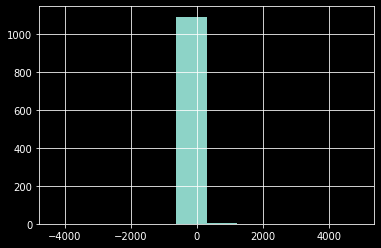

In [ ]:
test['error'].hist()

In [ ]:
np.mean([-2000,2010])

5.0

In [ ]:
test['error'].mean()

6.533819318181587

#Абсолютная ошибка

In [ ]:
test['error_abs'] = abs(test['error'])

In [ ]:
test.head()

,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude,price_pred,price_pred_all,error,error_abs
589,"Shanker Nagar, Veer Sawarkar Nagar,Nashik",Suhas,Apartment,old,2.0,59.00,31.24,1200.0,"Shankar Nagar, Veer Savarkar Nagar, Nashik, Ma...",20.01800,73.75111,61.604101,47.362954,2.604101,2.604101
4871,"Ambedkar Nagar, Chunchale,Nashik",Vijay Sambhare,Independent house,old,1.0,29.00,15.36,592.0,"Ambedkar Nagar, Chunchale, Nashik, Maharashtra",19.96401,73.72648,20.182718,18.788239,-8.817282,8.817282
245,"Prasad Park ,Ojhar, Nashik",Shiv Shanker Ray,Apartment,old,0.0,23.00,12.18,826.0,Prasasd Park,20.09998,73.92808,27.189413,24.545043,4.189413,4.189413
2873,"Ashtavinayak Colony, Veer Sawarkar Nagar,Nashik",Mr Sanjay,Apartment,old,3.0,31.77,31.77,1356.0,"Astavinayak Colony, Veer Savarkar Nagar, Nashi...",20.01507,73.75341,47.524421,31.766258,15.754421,15.754421
4603,"Dhurav Nagar, Satpur,Nashik",Kiran,Independent house,new,2.0,40.00,21.18,1500.0,"Satpur, Nashik, Maharashtra",19.99975,73.73383,34.688580,33.445958,-5.311420,5.311420


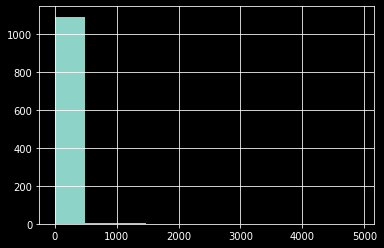

In [ ]:
test['error_abs'].hist()

In [ ]:
test['error_abs'].describe()

count    1100.000000
mean       24.094140
std       208.634079
min         0.008014
25%         2.735081
50%         6.148981
75%        11.429184
max      4910.591051
Name: error_abs, dtype: float64

In [ ]:
test.sort_values('error_abs',ascending=False).head(20)

,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude,price_pred,price_pred_all,error,error_abs
1566,"Balawant Nagar, Anandwalli Gaon,Nashik",Greenwood Builder Pvt Ltd,Apartment,old,3.0,77.41,38.43,0.0,"Balawant Nagar, Anandvalli, Nashik, Maharashtra",20.012770,73.739920,4988.001051,5668.594697,4910.591051,4910.591051
1583,"Nashik Road, Nashik",Deepak Builders And Developers,Apartment,old,2.0,5678.00,30.07,0.0,"Nashik Road, Nashik, Maharashtra",19.955310,73.840890,1374.116898,1558.260623,-4303.883102,4303.883102
1618,"Radha Vasudev Batavia Nagar, Govind Nagar,Nashik",Sairaj Builders & Developers,Apartment,old,3.0,61.56,32.60,0.0,"Govind Nagar, Nashik, Maharashtra",19.983200,73.778830,1287.550505,967.406151,1225.990505,1225.990505
2399,"Balawant Nagar, Anandwalli Gaon,Nashik",Zion Worldwide,Apartment,old,3.0,67.21,29.18,0.0,"Balawant Nagar, Anandvalli, Nashik, Maharashtra",20.012770,73.739920,1217.640100,1030.074056,1150.430100,1150.430100
1033,"Atharv Colony, Veer Sawarkar Nagar,Nashik",Patil Shah Housing Corporation,Apartment,old,3.0,126.00,62.44,0.0,"Atharv Colony Road, Veer Savarkar Nagar, Nashi...",20.017983,73.754094,1005.170264,1392.749524,879.170264,879.170264
1606,"Sant Kabir Nagar, Veer Sawarkar Nagar,Nashik",Ms Amber Estate,Apartment,old,3.0,59.91,31.72,0.0,"Veer Savarkar Nagar, Nashik, Maharashtra",20.017360,73.752000,901.797832,351.882753,841.887832,841.887832
5482,"Mahatma Nagar, Parijat Nagar,Nashik",Rachita Constructions Pvt. Ltd,Independent house,old,2.0,56.50,29.92,0.0,"Mahatmanagar, Parijat Nagar, Nashik, Maharashtra",20.000380,73.754420,822.012231,401.376750,765.512231,765.512231
5087,"Matoshree Nagar, Nashik",Khan Abdul Aziz,Independent house,old,4.0,700.00,3.48,4000.0,"Matoshree Nagar, Tidke Colony, Nashik, Maharas...",19.988690,73.777170,243.981183,265.571090,-456.018817,456.018817
1411,"Chandshi, Nashik",Suyojit Infrastructure Pvt Ltd.,Apartment,old,2.0,48.24,25.54,0.0,"Chandshi, Nashik Sub-District, Nashik, Maharas...",20.038750,73.750250,462.988918,332.200306,414.748918,414.748918
4794,"Deolali Gaon, Nashik",ND Developers,Independent house,old,0.0,108.00,53.60,0.0,"Deolali Gaon, Devlali, Nashik, Maharashtra",19.944270,73.832290,428.645416,425.147460,320.645416,320.645416


#Анализ обсолютной ошибки относительно цены

In [ ]:
test['price_group'] = pd.qcut(test['price'],5)

In [ ]:
t = test.groupby('price_group')[['error_abs','error']].agg(['count','mean'])

In [ ]:
t.columns = ['_'.join(col).strip() for col in t.columns.values]

In [ ]:
t = t.drop('error_count',axis=1)

In [ ]:
t['mean_error_diff'] = t['error_abs_mean'] - test['error_abs'].mean()

In [ ]:
t['mean_error'] = test['error_abs'].mean()

In [ ]:
import seaborn as sns
cm = sns.dark_palette("red", as_cmap=True)

In [ ]:
t.style.background_gradient(cmap=cm,subset=['mean_error_diff'])

,error_abs_count,error_abs_mean,error_mean,mean_error_diff,mean_error
price_group,,,,,
"(-0.001, 9.0]",221,7.945731,6.774620,-16.148409,24.094140
"(9.0, 21.276]",219,7.117484,3.267080,-16.976656,24.094140
"(21.276, 32.504]",220,8.548780,2.504292,-15.545360,24.094140
"(32.504, 48.324]",220,13.092615,-1.060152,-11.001525,24.094140
"(48.324, 5678.0]",220,83.762326,21.167313,59.668186,24.094140


In [ ]:
test

,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude,price_pred,price_pred_all,error,error_abs,price_group
589,"Shanker Nagar, Veer Sawarkar Nagar,Nashik",Suhas,Apartment,old,2.0,59.00,31.24,1200.0,"Shankar Nagar, Veer Savarkar Nagar, Nashik, Ma...",20.018000,73.751110,61.604101,47.362954,2.604101,2.604101,"(48.324, 5678.0]"
4871,"Ambedkar Nagar, Chunchale,Nashik",Vijay Sambhare,Independent house,old,1.0,29.00,15.36,592.0,"Ambedkar Nagar, Chunchale, Nashik, Maharashtra",19.964010,73.726480,20.182718,18.788239,-8.817282,8.817282,"(21.276, 32.504]"
245,"Prasad Park ,Ojhar, Nashik",Shiv Shanker Ray,Apartment,old,0.0,23.00,12.18,826.0,Prasasd Park,20.099980,73.928080,27.189413,24.545043,4.189413,4.189413,"(21.276, 32.504]"
2873,"Ashtavinayak Colony, Veer Sawarkar Nagar,Nashik",Mr Sanjay,Apartment,old,3.0,31.77,31.77,1356.0,"Astavinayak Colony, Veer Savarkar Nagar, Nashi...",20.015070,73.753410,47.524421,31.766258,15.754421,15.754421,"(21.276, 32.504]"
4603,"Dhurav Nagar, Satpur,Nashik",Kiran,Independent house,new,2.0,40.00,21.18,1500.0,"Satpur, Nashik, Maharashtra",19.999750,73.733830,34.688580,33.445958,-5.311420,5.311420,"(32.504, 48.324]"
4011,"Near Anuradha Theatre,Anand Nagar, Nashik Road...","Astvinayak Real Estate,",Apartment,new,2.0,47.51,25.16,1080.0,"Anand Nagar, Upnagar, Nashik, Maharashtra",19.971140,73.820900,32.610816,35.133047,-14.899184,14.899184,"(32.504, 48.324]"
865,"Dhanvi Residency, Murari Nagar, Nashik",Pradip Deore,Apartment,old,2.0,32.00,16.95,825.0,"Murari Nagar, Cidco, Nashik, Maharashtra",19.971920,73.746480,29.145919,26.869478,-2.854081,2.854081,"(21.276, 32.504]"
4254,"Anushree Apatment,Siemens Colony, Rane Nagar,N...",Navin Chavan,Apartment,new,2.0,36.54,19.35,1015.0,"Rane Nagar, Indira Nagar, Nashik, Maharashtra",19.965230,73.767950,24.654715,11.043916,-11.885285,11.885285,"(32.504, 48.324]"
932,"Chetana Nagar, Rane Nagar,Nashik",Sachin Suresh Pofale,Apartment,old,2.0,32.00,16.95,660.0,"Chetana Nagar, Indira Nagar, Nashik, Maharashtra",19.963110,73.771130,24.903956,25.586486,-7.096044,7.096044,"(21.276, 32.504]"
625,"Prashant Nagar, Pathardi Phata,Nashik",Vàrsha,Apartment,old,2.0,30.00,15.89,880.0,"Prashant Nagar, Pathardi Phata, Nashik, Mahara...",19.951040,73.756990,26.642009,27.589862,-3.357991,3.357991,"(21.276, 32.504]"


In [ ]:
t = test.groupby('bhk')[['error_abs','error']].agg(['count','mean'])

In [ ]:
t.columns = ['_'.join(col).strip() for col in t.columns.values]

In [ ]:
t = t.drop('error_count',axis=1)

In [ ]:
t['mean_error_diff'] = t['error_abs_mean'] - test['error_abs'].mean()

In [ ]:
t['mean_error'] = test['error_abs'].mean()

In [ ]:
t.style.background_gradient(cmap=cm,subset=['mean_error_diff'])

,error_abs_count,error_abs_mean,error_mean,mean_error_diff,mean_error
bhk,,,,,
0.0,41,34.945561,34.229695,10.851421,24.094140
1.0,323,6.231607,1.245391,-17.862533,24.094140
2.0,499,18.973518,-7.755125,-5.120622,24.094140
3.0,191,59.887267,50.695499,35.793127,24.094140
3.5,1,272.511484,272.511484,248.417345,24.094140
4.0,31,50.107593,-20.354503,26.013453,24.094140
5.0,8,25.340846,1.018265,1.246706,24.094140
6.0,1,23.603053,-23.603053,-0.491086,24.094140
7.0,1,3.020732,-3.020732,-21.073407,24.094140


In [ ]:
def print_error(col1):
 t = test.groupby(col1)[['error_abs','error']].agg(['count','mean'])
 t.columns = ['_'.join(col).strip() for col in t.columns.values]
 t = t.drop('error_count',axis=1)
 t['mean_error_diff'] = t['error_abs_mean'] - test['error_abs'].mean()
 t['mean_error'] = test['error_abs'].mean()
 display(t.style.background_gradient(cmap=cm,subset=['mean_error_diff']))

In [ ]:
print_error('bhk')

,error_abs_count,error_abs_mean,error_mean,mean_error_diff,mean_error
bhk,,,,,
0.0,41,34.945561,34.229695,10.851421,24.094140
1.0,323,6.231607,1.245391,-17.862533,24.094140
2.0,499,18.973518,-7.755125,-5.120622,24.094140
3.0,191,59.887267,50.695499,35.793127,24.094140
3.5,1,272.511484,272.511484,248.417345,24.094140
4.0,31,50.107593,-20.354503,26.013453,24.094140
5.0,8,25.340846,1.018265,1.246706,24.094140
6.0,1,23.603053,-23.603053,-0.491086,24.094140
7.0,1,3.020732,-3.020732,-21.073407,24.094140


In [ ]:
print_error('housetype')

,error_abs_count,error_abs_mean,error_mean,mean_error_diff,mean_error
housetype,,,,,
Apartment,872,24.269303,6.841054,0.175163,24.094140
Independent house,228,23.424217,5.358782,-0.669923,24.094140


Для модели лучше всего подходит Independent house	

In [ ]:
print_error('house_condition')

,error_abs_count,error_abs_mean,error_mean,mean_error_diff,mean_error
house_condition,,,,,
new,342,9.610431,0.252911,-14.483708,24.094140
old,758,30.629006,9.367686,6.534866,24.094140


Для модели лучше всего подходит new

In [ ]:
model.get_feature_importance(prettified=True)

,Feature Id,Importances
0,per_month_emi,39.779114
1,total_sqft,32.895806
2,owners,6.994966
3,bhk,6.902536
4,cordinates,6.625356
5,latitude,2.329097
6,address,1.953285
7,longitude,1.918273
8,housetype,0.529135
9,house_condition,0.072432


#Shap

In [ ]:
! pip install shap

     |████████████████████████████████| 564 kB 5.1 MB/s 


In [ ]:
import shap
shap.initjs()

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(test[X])

In [ ]:
pd.DataFrame(shap_values,columns=X)

,address,owners,housetype,house_condition,bhk,per_month_emi,total_sqft,cordinates,latitude,longitude
0,-0.139990,-5.011476,-0.611790,0.261755,-5.581320,103.727298,-95.633542,5.274338,6.910897,2.288729
1,-0.454885,-0.120377,2.864036,-0.026416,-4.376146,-17.698381,1.351583,-9.259980,-3.771833,1.555916
2,-1.078493,-3.930051,-0.626079,-0.425814,2.983961,-17.628681,-2.858735,-1.228534,3.541497,-1.678859
3,-1.497748,-17.781873,-0.635299,0.282236,4.314595,110.613499,-113.826811,5.297282,11.582866,-0.943527
4,-0.206203,3.311514,2.942365,0.273911,-5.866000,-9.824720,-2.713432,-5.829028,1.296764,1.184208
5,-0.895057,-3.586171,-0.618467,-0.096411,-5.253237,7.010346,-16.041209,6.908155,-3.824656,-1.111678
6,0.288836,0.569961,-0.538415,0.020657,-3.800110,-10.588087,-1.359828,-4.580897,-2.836557,1.851157
7,-1.136160,17.111365,-0.619123,0.271126,-8.747288,-20.279318,-16.649382,8.250275,-4.311756,0.645776
8,-0.670325,2.519829,-0.710162,0.020981,-4.840173,-12.936227,-2.070491,-3.364761,-3.293012,0.129096
9,-1.829033,0.111081,-0.571651,0.036685,-4.027288,-11.282361,-0.692492,-3.432305,-3.142632,1.352803


In [ ]:
train['price'].mean()

50.61314225053077

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], test[X].iloc[0,:])

# Топ 10 ошибок

In [ ]:
shap_cols = [x+'_shap' for x in X]

In [ ]:
shap_cols

['address_shap',
 'owners_shap',
 'housetype_shap',
 'house_condition_shap',
 'bhk_shap',
 'per_month_emi_shap',
 'total_sqft_shap',
 'cordinates_shap',
 'latitude_shap',
 'longitude_shap']

In [ ]:
shap_values_df = pd.DataFrame(shap_values,columns=shap_cols)

In [ ]:
shap_values_df

,address_shap,owners_shap,housetype_shap,house_condition_shap,bhk_shap,per_month_emi_shap,total_sqft_shap,cordinates_shap,latitude_shap,longitude_shap
0,-0.139990,-5.011476,-0.611790,0.261755,-5.581320,103.727298,-95.633542,5.274338,6.910897,2.288729
1,-0.454885,-0.120377,2.864036,-0.026416,-4.376146,-17.698381,1.351583,-9.259980,-3.771833,1.555916
2,-1.078493,-3.930051,-0.626079,-0.425814,2.983961,-17.628681,-2.858735,-1.228534,3.541497,-1.678859
3,-1.497748,-17.781873,-0.635299,0.282236,4.314595,110.613499,-113.826811,5.297282,11.582866,-0.943527
4,-0.206203,3.311514,2.942365,0.273911,-5.866000,-9.824720,-2.713432,-5.829028,1.296764,1.184208
5,-0.895057,-3.586171,-0.618467,-0.096411,-5.253237,7.010346,-16.041209,6.908155,-3.824656,-1.111678
6,0.288836,0.569961,-0.538415,0.020657,-3.800110,-10.588087,-1.359828,-4.580897,-2.836557,1.851157
7,-1.136160,17.111365,-0.619123,0.271126,-8.747288,-20.279318,-16.649382,8.250275,-4.311756,0.645776
8,-0.670325,2.519829,-0.710162,0.020981,-4.840173,-12.936227,-2.070491,-3.364761,-3.293012,0.129096
9,-1.829033,0.111081,-0.571651,0.036685,-4.027288,-11.282361,-0.692492,-3.432305,-3.142632,1.352803


In [ ]:
test

,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude,price_pred,price_pred_all,error,error_abs,price_group
589,"Shanker Nagar, Veer Sawarkar Nagar,Nashik",Suhas,Apartment,old,2.0,59.00,31.24,1200.0,"Shankar Nagar, Veer Savarkar Nagar, Nashik, Ma...",20.018000,73.751110,61.604101,47.362954,2.604101,2.604101,"(48.324, 5678.0]"
4871,"Ambedkar Nagar, Chunchale,Nashik",Vijay Sambhare,Independent house,old,1.0,29.00,15.36,592.0,"Ambedkar Nagar, Chunchale, Nashik, Maharashtra",19.964010,73.726480,20.182718,18.788239,-8.817282,8.817282,"(21.276, 32.504]"
245,"Prasad Park ,Ojhar, Nashik",Shiv Shanker Ray,Apartment,old,0.0,23.00,12.18,826.0,Prasasd Park,20.099980,73.928080,27.189413,24.545043,4.189413,4.189413,"(21.276, 32.504]"
2873,"Ashtavinayak Colony, Veer Sawarkar Nagar,Nashik",Mr Sanjay,Apartment,old,3.0,31.77,31.77,1356.0,"Astavinayak Colony, Veer Savarkar Nagar, Nashi...",20.015070,73.753410,47.524421,31.766258,15.754421,15.754421,"(21.276, 32.504]"
4603,"Dhurav Nagar, Satpur,Nashik",Kiran,Independent house,new,2.0,40.00,21.18,1500.0,"Satpur, Nashik, Maharashtra",19.999750,73.733830,34.688580,33.445958,-5.311420,5.311420,"(32.504, 48.324]"
4011,"Near Anuradha Theatre,Anand Nagar, Nashik Road...","Astvinayak Real Estate,",Apartment,new,2.0,47.51,25.16,1080.0,"Anand Nagar, Upnagar, Nashik, Maharashtra",19.971140,73.820900,32.610816,35.133047,-14.899184,14.899184,"(32.504, 48.324]"
865,"Dhanvi Residency, Murari Nagar, Nashik",Pradip Deore,Apartment,old,2.0,32.00,16.95,825.0,"Murari Nagar, Cidco, Nashik, Maharashtra",19.971920,73.746480,29.145919,26.869478,-2.854081,2.854081,"(21.276, 32.504]"
4254,"Anushree Apatment,Siemens Colony, Rane Nagar,N...",Navin Chavan,Apartment,new,2.0,36.54,19.35,1015.0,"Rane Nagar, Indira Nagar, Nashik, Maharashtra",19.965230,73.767950,24.654715,11.043916,-11.885285,11.885285,"(32.504, 48.324]"
932,"Chetana Nagar, Rane Nagar,Nashik",Sachin Suresh Pofale,Apartment,old,2.0,32.00,16.95,660.0,"Chetana Nagar, Indira Nagar, Nashik, Maharashtra",19.963110,73.771130,24.903956,25.586486,-7.096044,7.096044,"(21.276, 32.504]"
625,"Prashant Nagar, Pathardi Phata,Nashik",Vàrsha,Apartment,old,2.0,30.00,15.89,880.0,"Prashant Nagar, Pathardi Phata, Nashik, Mahara...",19.951040,73.756990,26.642009,27.589862,-3.357991,3.357991,"(21.276, 32.504]"


In [ ]:
test_shap = pd.concat([test.reset_index(),shap_values_df],axis=1)

In [ ]:
len(test)

1100

In [ ]:
test_shap = test_shap.sort_values('error_abs',ascending=False)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, test_shap[shap_cols].values[0,:], test_shap[X].iloc[0,:])

In [ ]:
pd.options.display.max_columns = 100

In [ ]:
test_shap.head()

,index,address,owners,housetype,house_condition,bhk,price,per_month_emi,total_sqft,cordinates,latitude,longitude,price_pred,price_pred_all,error,error_abs,price_group,address_shap,owners_shap,housetype_shap,house_condition_shap,bhk_shap,per_month_emi_shap,total_sqft_shap,cordinates_shap,latitude_shap,longitude_shap
875,1566,"Balawant Nagar, Anandwalli Gaon,Nashik",Greenwood Builder Pvt Ltd,Apartment,old,3.0,77.41,38.43,0.0,"Balawant Nagar, Anandvalli, Nashik, Maharashtra",20.012770,73.739920,4988.001051,5668.594697,4910.591051,4910.591051,"(48.324, 5678.0]",86.368923,26.017705,19.679798,2.835283,134.154746,2209.644647,1562.494976,462.725426,155.143944,278.816401
577,1583,"Nashik Road, Nashik",Deepak Builders And Developers,Apartment,old,2.0,5678.00,30.07,0.0,"Nashik Road, Nashik, Maharashtra",19.955310,73.840890,1374.116898,1558.260623,-4303.883102,4303.883102,"(48.324, 5678.0]",16.458428,308.214633,-0.873292,-1.956721,7.181543,628.508227,402.611000,-12.424620,-71.244744,47.523243
959,1618,"Radha Vasudev Batavia Nagar, Govind Nagar,Nashik",Sairaj Builders & Developers,Apartment,old,3.0,61.56,32.60,0.0,"Govind Nagar, Nashik, Maharashtra",19.983200,73.778830,1287.550505,967.406151,1225.990505,1225.990505,"(48.324, 5678.0]",28.256649,-95.209298,10.297229,1.795541,44.928207,653.662390,467.820729,136.871242,2.122353,-13.113739
120,2399,"Balawant Nagar, Anandwalli Gaon,Nashik",Zion Worldwide,Apartment,old,3.0,67.21,29.18,0.0,"Balawant Nagar, Anandvalli, Nashik, Maharashtra",20.012770,73.739920,1217.640100,1030.074056,1150.430100,1150.430100,"(48.324, 5678.0]",12.383811,-44.034744,2.873018,1.411563,45.170383,442.871943,424.094492,141.683579,104.122775,36.944082
678,1033,"Atharv Colony, Veer Sawarkar Nagar,Nashik",Patil Shah Housing Corporation,Apartment,old,3.0,126.00,62.44,0.0,"Atharv Colony Road, Veer Savarkar Nagar, Nashi...",20.017983,73.754094,1005.170264,1392.749524,879.170264,879.170264,"(48.324, 5678.0]",56.675865,-51.255536,4.570580,2.798240,56.154855,471.524992,356.804267,69.806551,5.657759,-17.686509


In [ ]:
train['housetype'].values

array(['Apartment', 'Apartment', 'Apartment', ..., 'Independent house',
       'Independent house', 'Apartment'], dtype=object)

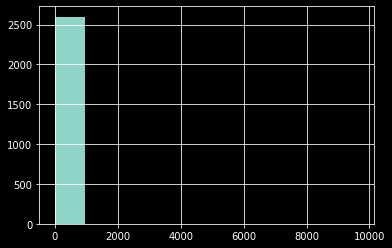

In [ ]:
train[train['housetype'] == 'Apartment']['price'].hist()

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, test_shap[shap_cols].head(10).values,
                                          test_shap[X].head(10))

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, test_shap[shap_cols].values,
                                          test_shap[X])

# Dependence plot

In [ ]:
X

['model',
 'year',
 'transmission',
 'mileage',
 'fuelType',
 'tax',
 'mpg',
 'engineSize']

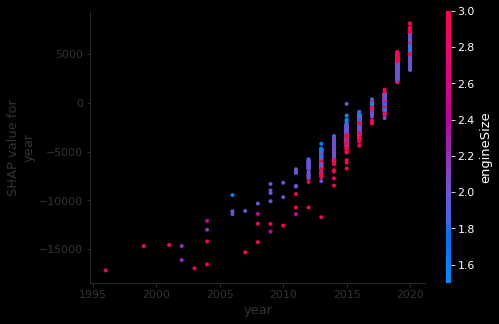

In [ ]:
shap.dependence_plot("year", shap_values, test[X])

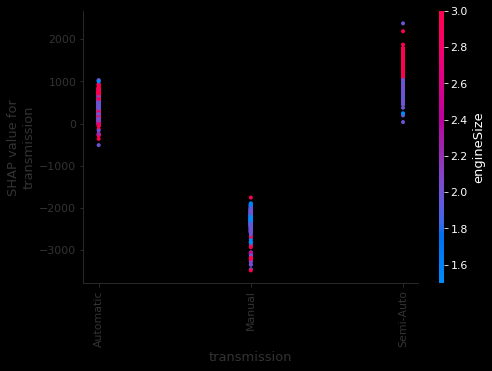

In [ ]:
shap.dependence_plot("transmission", shap_values, test[X])

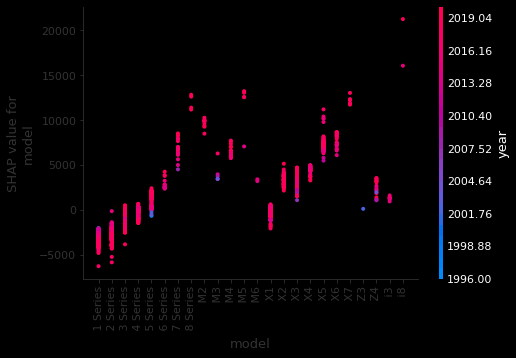

In [ ]:
shap.dependence_plot("model", shap_values, test[X])

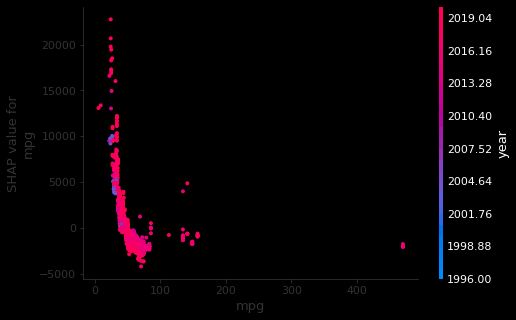

In [ ]:
shap.dependence_plot("mpg", shap_values, test[X])

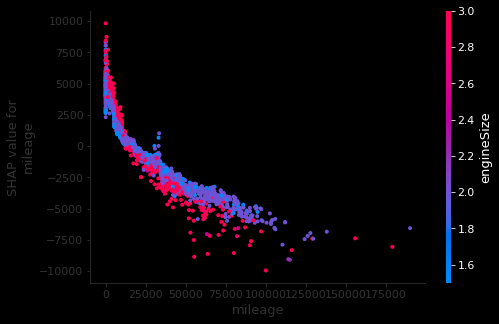

In [ ]:
shap.dependence_plot("mileage", shap_values, test[X])

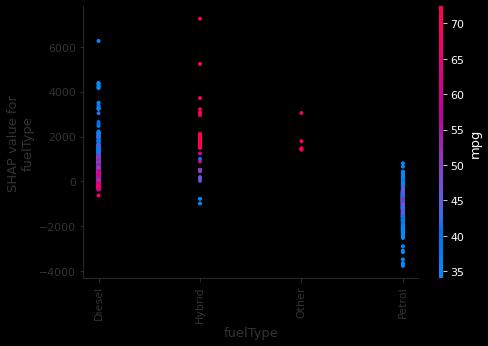

In [ ]:
shap.dependence_plot("fuelType", shap_values, test[X])

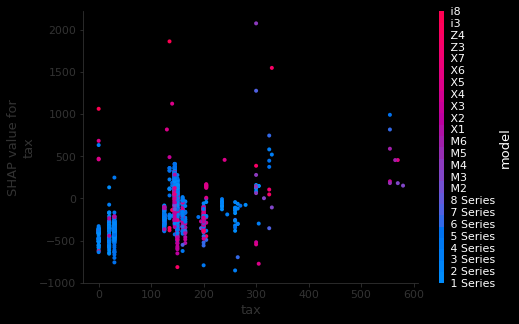

In [ ]:
shap.dependence_plot("tax", shap_values, test[X])

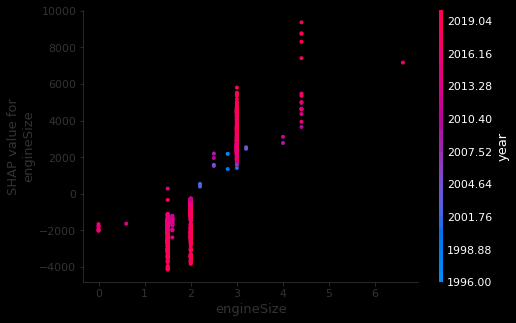

In [ ]:
shap.dependence_plot("engineSize", shap_values, test[X])

# Summary plot

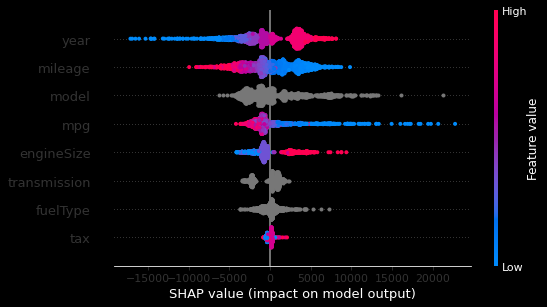

In [ ]:
shap.summary_plot(shap_values, test[X])